## Dataset : Airbnb Singapore Dataset from InsideAirbnb
Dataset from Airbnb : **"Singapore, 29 December 2022"**  
Source: http://insideairbnb.com/get-the-data/

### EDA on Middle 23 Variables in dataset  
The purpose of this file is to conduct exploratory data analysis on the middle 23 variables in our dataset.  
### Done by: <b>Isaac Chun</b>

---

### Essential Libraries

Import essential libraries such as numpy, pandas, matplotlib and seaborn.

> NumPy : Library for Numeric Computations in Python  
> Pandas : Library for Data Acquisition and Preparation  
> Matplotlib : Low-level library for Data Visualization  
> Seaborn : Higher-level library for Data Visualization  

In [694]:
import numpy as np
import pandas as pd 
import seaborn as sb 
import matplotlib.pyplot as plt 
sb.set() #Set the default seaborn style for graphics

### Additional Libraries

Import additional libraries

> Wordcloud : Library to create tag clouds in Python  
> Folium : Plot a map visualization in Python  
> Geopandas : Handle geojson data to generate chloropelth maps

In [695]:
from wordcloud import WordCloud
import folium
import geopandas

---
# Features Description

This dataset contains 75 features about Airbnb listings within Singapore. This notebook encompasses the cleaning & exploration <br>data analysis (EDA) of the middle 23 features.
Below are the features with their respective descriptions</br>

26.  <b>host_has_profile_pic</b>: A binary variable if the host has a profile picture
27.  <b>host_identify_verified</b>: Whether the host has a verified identity
28.  <b>neighbourhood</b>: The general neighbourhood of the property listing
29.  <b>neighbourhood_cleansed</b>: The neighbourhood as geocoded using the latitude and longitude against neighborhoods as defined by open or public digital shapefiles.
30.  <b>neighbourhood_group_cleansed</b>: The neighbourhood group as geocoded using the latitude and longitude against neighborhoods as defined by open or public digital shapefiles.
31.  <b>latitude</b>: the latitude of this property
32.  <b>longitude</b>: the longitude of this property
33.  <b>property_type</b>: Self selected property type. Hotels and Bed and Breakfasts are described as such by their hosts in this field
34.  <b>room_type</b>: All homes are grouped into the following room types: [Entire home/apt, Private room, Shared room, Hotel room]
35. <b>accommodates</b>: The maximum capacity of the listing
36. <b>bedrooms</b>: The number of bedrooms
37. <b>beds</b>: The number of bed(s)
38. <b>amenities</b>: The amenities in this room
39. <b>price</b>: daily price in local currency
40. <b>minimum_nights</b>: minimum number of night stay for the listing 
41. <b>maximum_nights</b>: maximum number of night stay for the listing different)
42. <b>minimum_minimum_nights</b>: the smallest minimum_night value from the calender (looking 365 nights in the future)
42. <b>maximum_minimum_nights</b>: the largest minimum_night value from the calender (looking 365 nights in the future)
43. <b>minimum_maximum_nights</b>: the smallest maximum_night value from the calender (looking 365 nights in the future)
44. <b>maximum_maximum_nights</b>: the largest maximum_night value from the calender (looking 365 nights in the future)
45. <b>minimum_nights_avg_ntm</b>: the average minimum_night value from the calender (looking 365 nights in the future)
46. <b>maximum_nights_avg_ntm</b>: the average maximum_night value from the calender (looking 365 nights in the future)
47. <b>calendar_updated</b>: when was this listing updated

--- 
## Visual Data Cleaning

##### In the context of maximizing host profit, the following features can be dropped from the dataset as they provide no relevant insights for our predictions.

1.  **host_has_profile_pic** : Does not provide relevant insights to our predictions.
2.  **host_identity_verified** : We have another column that already shows the host's identification
3.  **neighbourhood** : We have another column that is more accurate in the csv, and this column is all just Singapore
4.  **bathrooms** : All the columns are blank.
5.  **minimum_minimum_nights** : Does not provide relevant insights to our predictions, and can be calculated by ourselves, both columns are the same.
6.  **maximum_minimum_nights** : Does not provide relevant insights to our predictions, and can be calculated by ourselves, both columns are the same.
7.  **minimum_maximum_nights** : Does not provide relevant insights to our predictions, and can be calculated by ourselves, both columns are the same.
8.  **maximum_maximum_nights** : Does not provide relevant insights to our predictions, and can be calculated by ourselves, both columns are the same.
9.  **minimum_nights_avg_ntm** : Does not provide relevant insights to our predictions, and can be calculated by ourselves, both columns are the same.
10. **maximum_nights_avg_ntm** : Does not provide relevant insights to our predictions, and can be calculated by ourselves, both columns are the same.
11. **calendar_updated** : All the columns are blank.
12. **room_type** : We can acquire insights for this row using property_type, so we will drop it.

---
### Below are features that we think might be informative for analyzing factors that impact host profit, so we shall conduct our EDA on them and gather insights:

1.  **neighbourhood_cleansed** : This may be helpful to determine which neighbourhood listings usually have higher price listings, so the hosts can maximise profits
2.  **neighbourhood_group_cleansed** : This may be helpful to determine which region has higher price listings or greater concentration of listings so the host can maximise profits
3.  **latitude** : The location of the house might matter when trying to maximise profits
4.  **longitude** : The location of the house might matter when trying to maximise profits
5.  **property_type** : The property type might affect the listing price of the house, so we have to conduct our own EDA to find out
6.  **accomodates** : Max number of accomodatees (stayers of the property) might affect house listing price
7. **beds** :Amount of beds might also matter and affect our host price listings
8. **amenities** : Total list of our amenities, so we shall conduct our EDA and see if theres a correlation
9. **price** : The price of the listing for relevant insights on the total price listing mean throughout Singapore.
10. **minimum_nights** : This is used to calculate our total profit as it is minimum nights, so we can calculate money earned by price * minimum_nights to gather our range of profit
11. **maximum_nights** : This is used to calculate our total profit as it is maximum nights, so we can calculate money earned by price * maximum_nights to gather our range of profit

In [696]:
def remove_outliers(df, columns, factor=1.5):
    # loop through each column and remove outliers based on the IQR method
    for col in columns:
        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3 - q1
        upper_bound = q3 + factor * iqr
        lower_bound = q1 - factor * iqr
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    
    return df

In [697]:
def countOutliers (df):
    #Get the q1 and q3 datas to find out the 25% and 75% range, then calculate inter quartile range and then find out whiskers.
    #Then count how many points lie outside of this range.
    q1 = df.quantile(0.25)
    q3 = df.quantile(0.75)
    #Interquartile
    iqr = q3 - q1
    #Calculate whiskers
    leftWhisker = q1 - (1.5 * iqr)
    rightWhisker = q3 + (1.5 * iqr)
    outliers = 0;
    #Loop through data now
    for data in df:
        if(data < leftWhisker or data > rightWhisker):
            outliers+=1

    return outliers

---

>## Import the Dataset

In [698]:
airDF = pd.read_csv("listings.csv")
airDF.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,71609.0,https://www.airbnb.com/rooms/71609,2.022120e+13,12/29/2022,city scrape,Ensuite Room (Room 1 & 2) near EXPO,For 3 rooms.Book room 1&2 and room 4<br /><br ...,NaN,https://a0.muscache.com/pictures/24453191/3580...,367042,...,4.78,4.26,4.32,NaN,f,6,0,6,0,0.15
1,71896.0,https://www.airbnb.com/rooms/71896,2.022120e+13,12/29/2022,city scrape,B&B Room 1 near Airport & EXPO,<b>The space</b><br />Vocational Stay Deluxe B...,NaN,https://a0.muscache.com/pictures/2440674/ac4f4...,367042,...,4.43,4.17,4.04,NaN,t,6,0,6,0,0.17
2,71903.0,https://www.airbnb.com/rooms/71903,2.022120e+13,12/29/2022,city scrape,Room 2-near Airport & EXPO,"Like your own home, 24hrs access.<br /><br /><...",Quiet and view of the playground with exercise...,https://a0.muscache.com/pictures/568743/7bc623...,367042,...,4.64,4.50,4.36,NaN,f,6,0,6,0,0.33
3,275343.0,https://www.airbnb.com/rooms/275343,2.022120e+13,12/29/2022,city scrape,Amazing Room with window 10min to Redhill,Awesome location and host <br />Room near INSE...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,1439258,...,4.42,4.53,4.63,S0399,f,46,2,44,0,0.19
4,275344.0,https://www.airbnb.com/rooms/275344,2.022120e+13,12/29/2022,city scrape,15 mins to Outram MRT Single Room,Lovely home for the special guest !<br /><br /...,Bus stop <br />Food center <br />Supermarket,https://a0.muscache.com/pictures/miso/Hosting-...,1439258,...,4.54,4.62,4.46,S0399,f,46,2,44,0,0.11


In [699]:
airDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3035 entries, 0 to 3034
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            3035 non-null   float64
 1   listing_url                                   3035 non-null   object 
 2   scrape_id                                     3035 non-null   float64
 3   last_scraped                                  3035 non-null   object 
 4   source                                        3035 non-null   object 
 5   name                                          3035 non-null   object 
 6   description                                   2985 non-null   object 
 7   neighborhood_overview                         1973 non-null   object 
 8   picture_url                                   3035 non-null   object 
 9   host_id                                       3035 non-null   i

In [700]:
print(airDF.dtypes)

id                                              float64
listing_url                                      object
scrape_id                                       float64
last_scraped                                     object
source                                           object
                                                 ...   
calculated_host_listings_count                    int64
calculated_host_listings_count_entire_homes       int64
calculated_host_listings_count_private_rooms      int64
calculated_host_listings_count_shared_rooms       int64
reviews_per_month                               float64
Length: 75, dtype: object


> ## Handle our map in folium for data visualization

In [701]:
#Plot all first
lat_mean = airDF["latitude"].mean()
long_mean = airDF["longitude"].mean()
area_lat_long = pd.concat([airDF["latitude"],airDF["longitude"]], axis = 1)
area_lat_long = area_lat_long.values.tolist()

In [702]:
geo = pd.read_csv("geodata.csv")
geo = geo.sort_values(by =["name"])
geo.reset_index(drop = True)
geo.head(n=5)

,name,latitude,longitude
0,ANG MO KIO,1.369115,103.845434
1,BEDOK,1.323604,103.927341
2,BISHAN,1.352585,103.835212
31,BOON LAY,1.314289,103.708969
3,BUKIT BATOK,1.359029,103.763680


In [703]:
geojson = geopandas.read_file("sg.geojson")
geojson = geojson[['name','geometry']]
geojson.head(n=5)

,name,geometry
0,BISHAN,"POLYGON ((103.84924 1.36275, 103.84936 1.36268..."
1,BUKIT BATOK,"POLYGON ((103.76408 1.37001, 103.76444 1.36947..."
2,BUKIT MERAH,"POLYGON ((103.81740 1.29433, 103.81743 1.29431..."
3,BUKIT PANJANG,"POLYGON ((103.77445 1.39029, 103.77499 1.38607..."
4,BUKIT TIMAH,"POLYGON ((103.79766 1.34813, 103.79806 1.34779..."


In [704]:
mapDF = geojson.merge(geo, left_on = "name", right_on = "name", how = "outer")
mapDF = mapDF[~mapDF['geometry'].isna()]
mapDF.head(n=10)

,name,geometry,latitude,longitude
0,BISHAN,"POLYGON ((103.84924 1.36275, 103.84936 1.36268...",1.352585,103.835212
1,BUKIT BATOK,"POLYGON ((103.76408 1.37001, 103.76444 1.36947...",1.359029,103.763680
2,BUKIT MERAH,"POLYGON ((103.81740 1.29433, 103.81743 1.29431...",1.281905,103.823918
3,BUKIT PANJANG,"POLYGON ((103.77445 1.39029, 103.77499 1.38607...",1.377414,103.771950
4,BUKIT TIMAH,"POLYGON ((103.79766 1.34813, 103.79806 1.34779...",1.329411,103.802078
5,CENTRAL WATER CATCHMENT,"POLYGON ((103.80702 1.41126, 103.80754 1.40986...",1.355200,103.797200
6,CHANGI,"POLYGON ((103.98236 1.39356, 103.98242 1.39349...",1.344953,103.982597
7,CHANGI BAY,"MULTIPOLYGON (((104.02076 1.32566, 104.02139 1...",1.322244,104.027783
8,CHOA CHU KANG,"POLYGON ((103.74660 1.40541, 103.74691 1.40540...",1.383980,103.746961
9,CLEMENTI,"POLYGON ((103.75857 1.29929, 103.75831 1.29911...",1.316181,103.764938


In [705]:
#Create the map
map = folium.Map(
    #Center the map here at location
    location = [lat_mean, long_mean], zoom_start = 12
)
map

---
### 1. EDA on neighbourhood_cleansed
<b>neighbourhood_group_cleansed</b>: The neighbourhood group as geocoded using the latitude and longitude against neighborhoods as defined by open or public digital shapefiles.


In [706]:
neighbourhoodDF = pd.DataFrame(airDF["neighbourhood_cleansed"])
neighbourhoodDF

,neighbourhood_cleansed
0,Tampines
1,Tampines
2,Tampines
3,Bukit Merah
4,Bukit Merah
...,...
3030,Downtown Core
3031,Downtown Core
3032,Bedok
3033,Southern Islands


In [707]:
neighbourhoodDF.describe()

,neighbourhood_cleansed
count,3035
unique,42
top,Kallang
freq,353


<AxesSubplot:xlabel='neighbourhood_cleansed', ylabel='Count'>

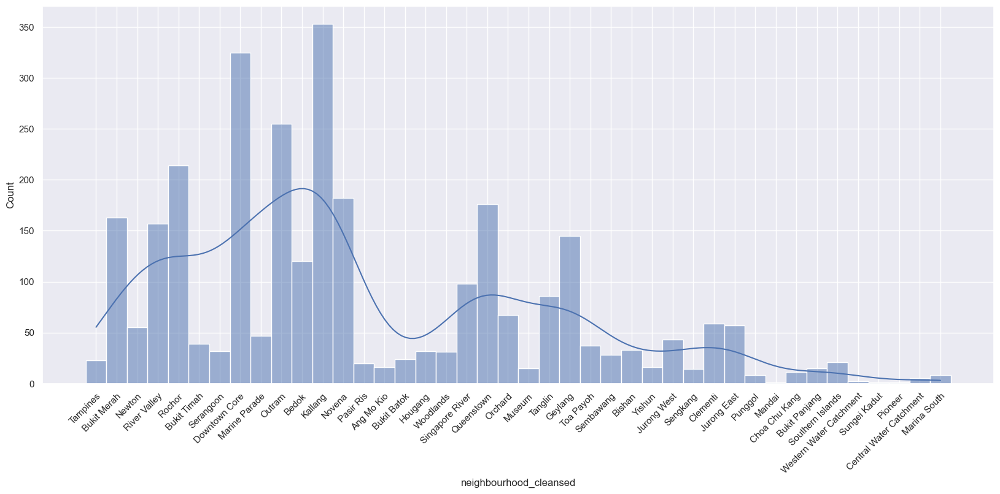

In [708]:
#Plot it against a histplot to see the results
f = plt.figure(figsize = (20,8))
plt.xticks(np.arange(0, len(neighbourhoodDF["neighbourhood_cleansed"].unique()), step=1))  # Set label locations.
plt.xticks(rotation =45, ha = "right", rotation_mode = "anchor")
sb.histplot(data = neighbourhoodDF["neighbourhood_cleansed"], kde = True)

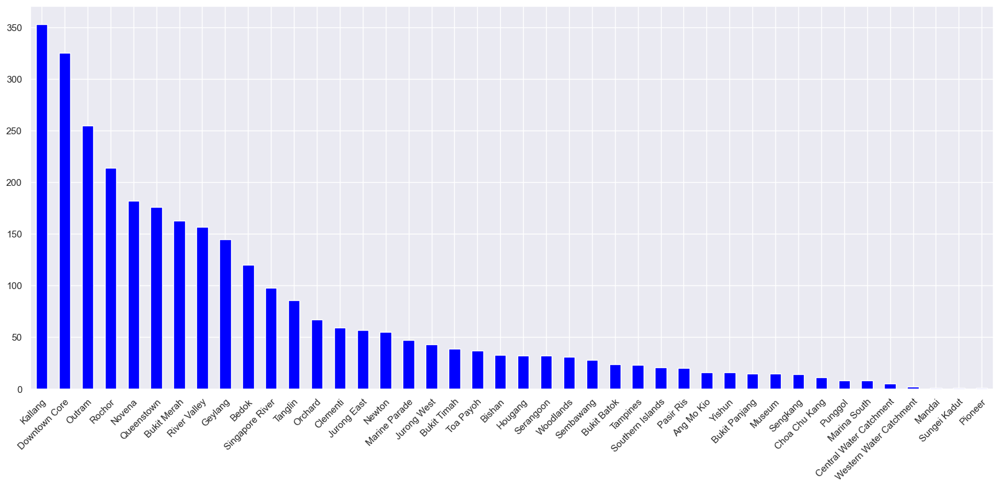

In [709]:
#Plot it against a different plot in ascending to see the results
f = plt.figure(figsize = (20,8))

neighbourhoodDF["neighbourhood_cleansed"].value_counts().plot(kind='bar',color=['blue'])
plt.xticks(np.arange(0, len(neighbourhoodDF["neighbourhood_cleansed"].unique()), step=1))  # Set label locations.
plt.xticks(rotation =45, ha = "right", rotation_mode = "anchor")
plt.show()
#sb.histplot(data = neighbourhoodDF["neighbourhood_cleansed"])

#### We can see that **Kallang** has the highest amount of listings, let us plot a map to see it with colors for better visualization

In [710]:
#Calculate the percentages and store it into a series
percentages = {}
numbers = {}
#Store keys
for x in mapDF["name"]:
    percentages[x] = 0
    numbers[x] = 0
#Then update all the values
for x in neighbourhoodDF["neighbourhood_cleansed"]:
    percentages[x.upper()] += 1
    numbers[x.upper()] += 1
    
#Calculate percentages
for key, item in percentages.items():
    percentages[key] = round((item/len(neighbourhoodDF["neighbourhood_cleansed"])*100),3)

percentages

{'BISHAN': 1.087,
 'BUKIT BATOK': 0.791,
 'BUKIT MERAH': 5.371,
 'BUKIT PANJANG': 0.494,
 'BUKIT TIMAH': 1.285,
 'CENTRAL WATER CATCHMENT': 0.165,
 'CHANGI': 0.0,
 'CHANGI BAY': 0.0,
 'CHOA CHU KANG': 0.362,
 'CLEMENTI': 1.944,
 'GEYLANG': 4.778,
 'NOVENA': 5.997,
 'PASIR RIS': 0.659,
 'PAYA LEBAR': 0.0,
 'SELETAR': 0.0,
 'SEMBAWANG': 0.923,
 'BEDOK': 3.954,
 'BOON LAY': 0.0,
 'SENGKANG': 0.461,
 'SERANGOON': 1.054,
 'ANG MO KIO': 0.527,
 'TENGAH': 0.0,
 'TOA PAYOH': 1.219,
 'WESTERN WATER CATCHMENT': 0.066,
 'YISHUN': 0.527,
 'DOWNTOWN CORE': 10.708,
 'MARINA EAST': 0.0,
 'NEWTON': 1.812,
 'ORCHARD': 2.208,
 'WOODLANDS': 1.021,
 'MARINA SOUTH': 0.264,
 'MUSEUM': 0.494,
 'HOUGANG': 1.054,
 'JURONG EAST': 1.878,
 'LIM CHU KANG': 0.0,
 'MANDAI': 0.033,
 'MARINE PARADE': 1.549,
 'NORTH-EASTERN ISLANDS': 0.0,
 'PIONEER': 0.033,
 'PUNGGOL': 0.264,
 'QUEENSTOWN': 5.799,
 'SOUTHERN ISLANDS': 0.692,
 'TUAS': 0.0,
 'JURONG WEST': 1.417,
 'KALLANG': 11.631,
 'SIMPANG': 0.0,
 'SUNGEI KADUT': 0.03

In [711]:
#Add our percentages into geo json
percentageMapDF = mapDF.copy()
#Set up new column
percentageMapDF["listingnumber"] = 0
percentageMapDF["percentage"] = 0

count = 0
#Add in according to name
for keys, value in percentages.items():
   percentageMapDF.loc[:,('percentage')][count] = value
   count += 1

count = 0
#Add in according to name
for keys, value in numbers.items():
   percentageMapDF.loc[:,('listingnumber')][count] = value
   count += 1

percentageMapDF.head(10)

/var/folders/q6/6qsmty7s2xj07bb_qyp5v77m0000gn/T/ipykernel_84642/3005170940.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  percentageMapDF.loc[:,('percentage')][count] = value
/var/folders/q6/6qsmty7s2xj07bb_qyp5v77m0000gn/T/ipykernel_84642/3005170940.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  percentageMapDF.loc[:,('listingnumber')][count] = value


,name,geometry,latitude,longitude,listingnumber,percentage
0,BISHAN,"POLYGON ((103.84924 1.36275, 103.84936 1.36268...",1.352585,103.835212,33,1.087
1,BUKIT BATOK,"POLYGON ((103.76408 1.37001, 103.76444 1.36947...",1.359029,103.763680,24,0.791
2,BUKIT MERAH,"POLYGON ((103.81740 1.29433, 103.81743 1.29431...",1.281905,103.823918,163,5.371
3,BUKIT PANJANG,"POLYGON ((103.77445 1.39029, 103.77499 1.38607...",1.377414,103.771950,15,0.494
4,BUKIT TIMAH,"POLYGON ((103.79766 1.34813, 103.79806 1.34779...",1.329411,103.802078,39,1.285
5,CENTRAL WATER CATCHMENT,"POLYGON ((103.80702 1.41126, 103.80754 1.40986...",1.355200,103.797200,5,0.165
6,CHANGI,"POLYGON ((103.98236 1.39356, 103.98242 1.39349...",1.344953,103.982597,0,0.000
7,CHANGI BAY,"MULTIPOLYGON (((104.02076 1.32566, 104.02139 1...",1.322244,104.027783,0,0.000
8,CHOA CHU KANG,"POLYGON ((103.74660 1.40541, 103.74691 1.40540...",1.383980,103.746961,11,0.362
9,CLEMENTI,"POLYGON ((103.75857 1.29929, 103.75831 1.29911...",1.316181,103.764938,59,1.944


### Let us visualize the distribution on the map

In [712]:
#Create the map
map = folium.Map(
    #Center the map here at location
    location = [lat_mean, long_mean], zoom_start = 12.5
)
#Make choropleth map
choro_test = folium.Choropleth(geo_data = geojson,
            data = percentageMapDF,
            columns = ['name','listingnumber'],
            key_on = 'feature.properties.name',
            fill_color = 'BuPu', # colour of choropleth
            nan_fill_color = "White", # color for empty data
            fill_opacity = 0.6, #density of colour
            line_opacity = 0.5,
            line_color = 'black',
            legend_name= "Listings",
            nan_fill_opacity = 0.1).add_to(map)

#Then add some clickable markers
# add marker one by one on the map
for i in range(0,len(percentageMapDF)):
   folium.Marker(
      location=[percentageMapDF.iloc[i]['latitude'], percentageMapDF.iloc[i]['longitude']],
      popup= percentageMapDF.iloc[i]['name'] + "\n Listings:" + str(percentageMapDF.iloc[i]['listingnumber']),
   ).add_to(map)

map

#### It is true that Kallang, Downtown Core and Outram has the highest proportion of houses as compared to the others areas as highlighted heavily in purple.

---
### 2. EDA on neighbourhood_group_cleansed
<b>neighbourhood_group_cleansed</b>: The neighbourhood group as geocoded using the latitude and longitude against neighborhoods as defined by open or public digital shapefiles.


In [713]:
neighbourhoodGroupDF = pd.DataFrame(airDF["neighbourhood_group_cleansed"])
neighbourhoodGroupDF

,neighbourhood_group_cleansed
0,East Region
1,East Region
2,East Region
3,Central Region
4,Central Region
...,...
3030,Central Region
3031,Central Region
3032,East Region
3033,Central Region


In [714]:
neighbourhoodGroupDF.describe()

,neighbourhood_group_cleansed
count,3035
unique,5
top,Central Region
freq,2476


<AxesSubplot:xlabel='neighbourhood_group_cleansed', ylabel='Count'>

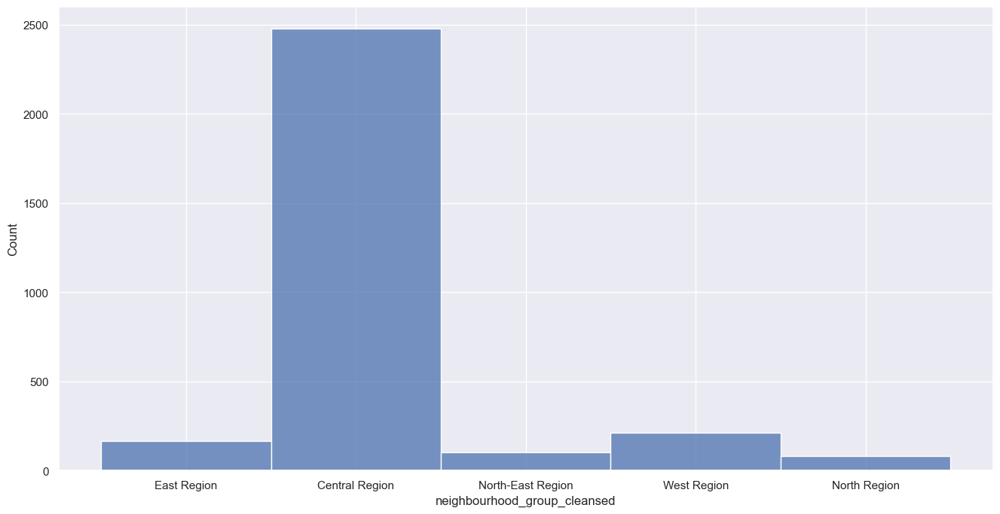

In [715]:
#Plot out a histogram to see the plots
f = plt.figure(figsize = (16,8))
sb.histplot(data = neighbourhoodGroupDF["neighbourhood_group_cleansed"])

#### We can see that there are many property listings in the central region as compared to the other regions like north east region or west region. This is probably due to the central region being closer as tourists attractions, so there is a higher amount of listings there.

---
### 3. EDA on latitude and longitude
<b>latitude</b>: the latitude of this property  
<b>longitude</b>: the longitude of this property

In [716]:
latlongDF = pd.DataFrame(airDF[["latitude","longitude"]])
latlongDF

,latitude,longitude
0,1.345370,103.958870
1,1.347540,103.959580
2,1.345310,103.961000
3,1.290150,103.808140
4,1.288360,103.811440
...,...,...
3030,1.281098,103.859833
3031,1.282450,103.857881
3032,1.329067,103.913455
3033,1.257238,103.821381


In [717]:
latlongDF.describe()

,latitude,longitude
count,3035.000000,3035.000000
mean,1.309683,103.843008
std,0.031663,0.041012
min,1.245557,103.678810
25%,1.286445,103.834025
50%,1.304540,103.846770
75%,1.317520,103.859725
max,1.453280,103.977662


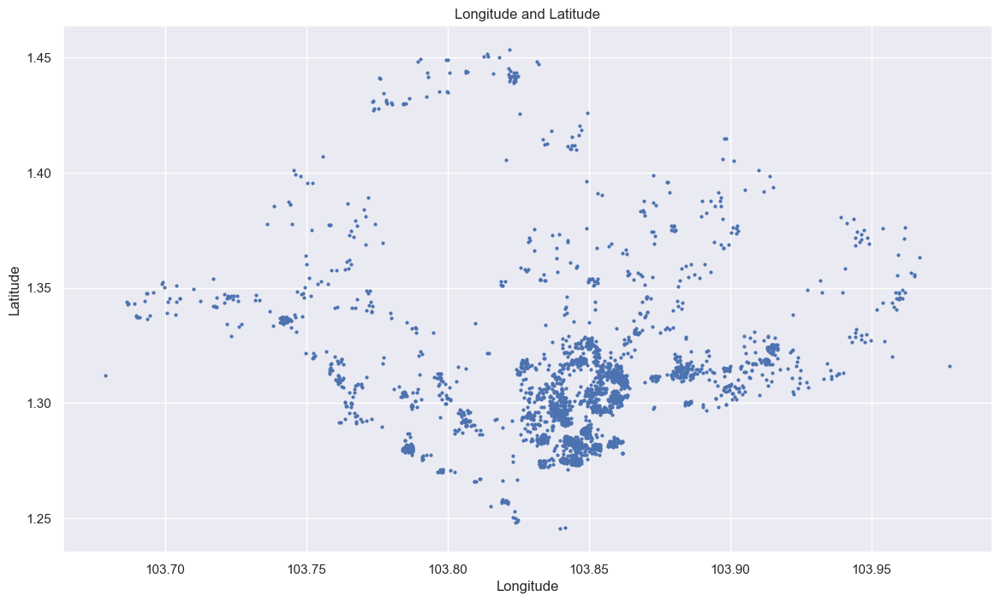

In [718]:
#Plot out the lat long of our in a plot to see the distribution of points
f = plt.figure(figsize = (14,8))
ax = f.add_subplot(1, 1, 1)

# Plot the data
ax.plot(latlongDF["longitude"], latlongDF["latitude"] ,marker='o', markersize=2, linestyle='')

# Set the title and axis labels
ax.set_title('Longitude and Latitude')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()

### Lets visualize this onto our map to see our properties

In [719]:
#Create the map
map = folium.Map(
    #Center the map here at location
    location = [lat_mean, long_mean], zoom_start = 12.5
)
#Make choropleth map
choro_test = folium.Choropleth(geo_data = geojson,
            data = percentageMapDF,
            columns = ['name','listingnumber'],
            key_on = 'feature.properties.name',
            fill_color = 'BuPu', # colour of choropleth
            nan_fill_color = "White", # color for empty data
            fill_opacity = 0.6, #density of colour
            line_opacity = 0.5,
            line_color = 'black',
            legend_name= "Listings",
            nan_fill_opacity = 0.1).add_to(map)

#Add our lat long points
#Plot all points
for point in range(0, len(area_lat_long)):
  _ = folium.Circle(
      radius = 10,
      location =  area_lat_long[point],
      popup = "{0}, {1},{2} \n{3}\n{4}".format(airDF["name"][point], area_lat_long[point][0], area_lat_long[point][1], airDF["listing_url"][point], airDF["neighbourhood_cleansed"][point]),
      color = "crimson",
      fill = True,
      fill_opacity = 0.5).add_to(map)

map

#### We can see a large number of points being concentrated in the central region, as well as Kallang, Downtown Core and Outram as shown in the EDA above, which can be good to cluster.

---
### 4. EDA on property_type
<b>property_type</b>: Self selected property type. Hotels and Bed and Breakfasts are described as such by their hosts in this field

In [720]:
propertyTypeDF = pd.DataFrame(airDF["property_type"])
propertyTypeDF

,property_type
0,Private room in villa
1,Private room in home
2,Private room in home
3,Private room in rental unit
4,Private room in rental unit
...,...
3030,Room in hotel
3031,Room in hotel
3032,Private room in rental unit
3033,Room in hotel


In [721]:
propertyTypeDF.describe()

,property_type
count,3035
unique,52
top,Private room in rental unit
freq,589


<AxesSubplot:xlabel='property_type', ylabel='Count'>

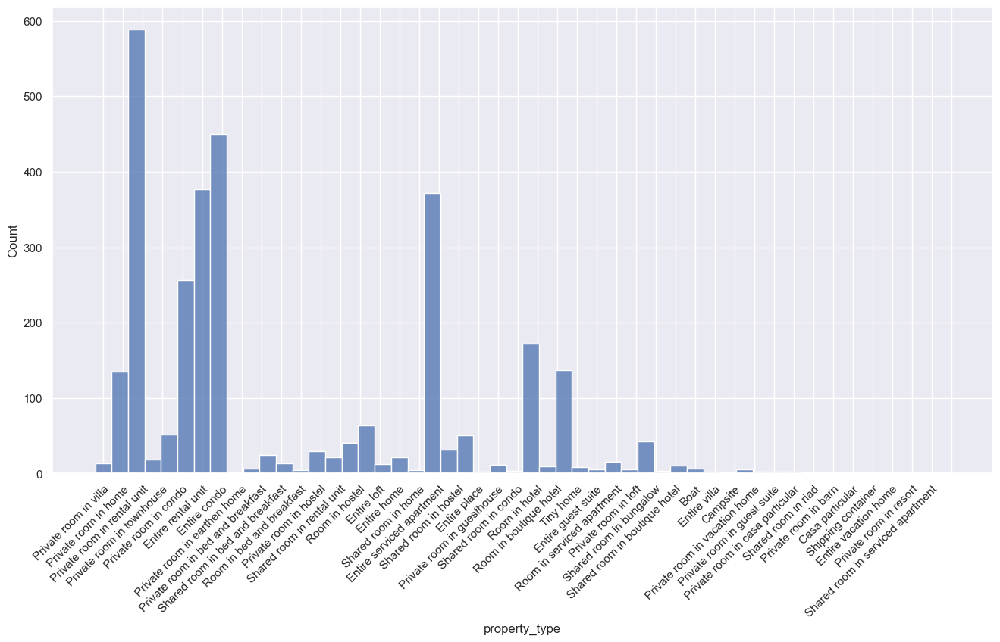

In [722]:
#Let us plot it to try to see and see if we can find any similarities
f = plt.figure(figsize = (16,8))
plt.xticks(np.arange(0, len(propertyTypeDF["property_type"].unique()), step=1.2))  # Set label locations.
plt.xticks(rotation = 45, ha = "right", rotation_mode = "anchor")
sb.histplot(data = propertyTypeDF["property_type"])

#### For property type, there are mainly three types, Private, Entire, Shared. The rest are either rooms in hostels or other niche categories. Let us group according to their categories to classify as one as we cannot work with so many different categories.

In [723]:
#Classify according to their first word up to the space
cleanedDF = pd.DataFrame(propertyTypeDF["property_type"])
count = 0
for x in cleanedDF["property_type"]:
    #Split this
    cleanedDF["property_type"].iloc[count] = cleanedDF["property_type"].iloc[count].split(" ", 1)[0]
    count += 1

cleanedDF

,property_type
0,Private
1,Private
2,Private
3,Private
4,Private
...,...
3030,Room
3031,Room
3032,Private
3033,Room


In [724]:
cleanedDF.value_counts()

property_type
Entire           1248
Private          1216
Room              437
Shared            117
Tiny                8
Boat                6
Campsite            1
Casa                1
Shipping            1
dtype: int64

<AxesSubplot:xlabel='property_type', ylabel='Count'>

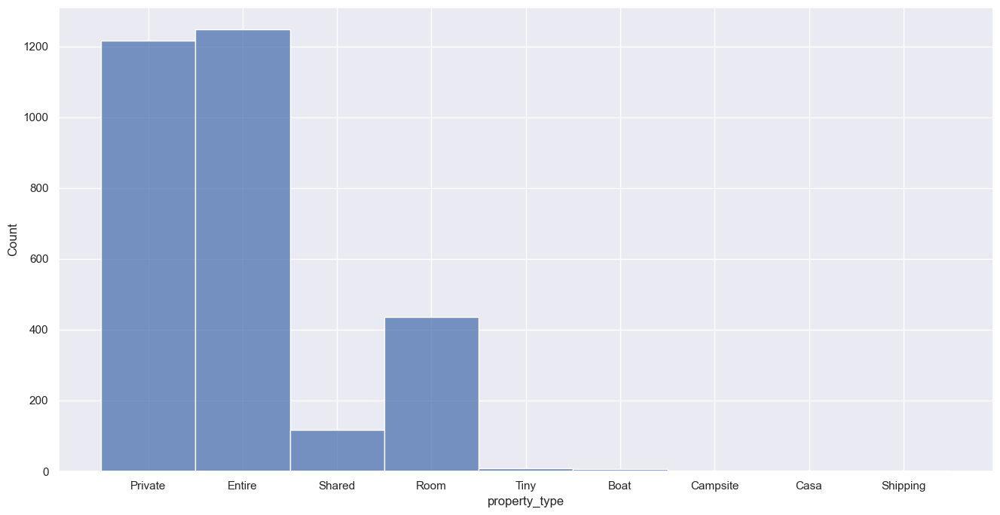

In [725]:
#Let us plot it to try to see and see if we can find any similarities
f = plt.figure(figsize = (16,8))
sb.histplot(data = cleanedDF["property_type"])

### Drop all the outliers

In [726]:
dropStrings = ["Tiny", "Boat", "Campsite", "Casa", "Shipping"]
df = cleanedDF.copy()
df = df[df.property_type.isin(dropStrings) == False]
df

,property_type
0,Private
1,Private
2,Private
3,Private
4,Private
...,...
3029,Private
3030,Room
3031,Room
3032,Private


In [727]:
df.describe()

,property_type
count,3018
unique,4
top,Entire
freq,1248


<AxesSubplot:xlabel='property_type', ylabel='Count'>

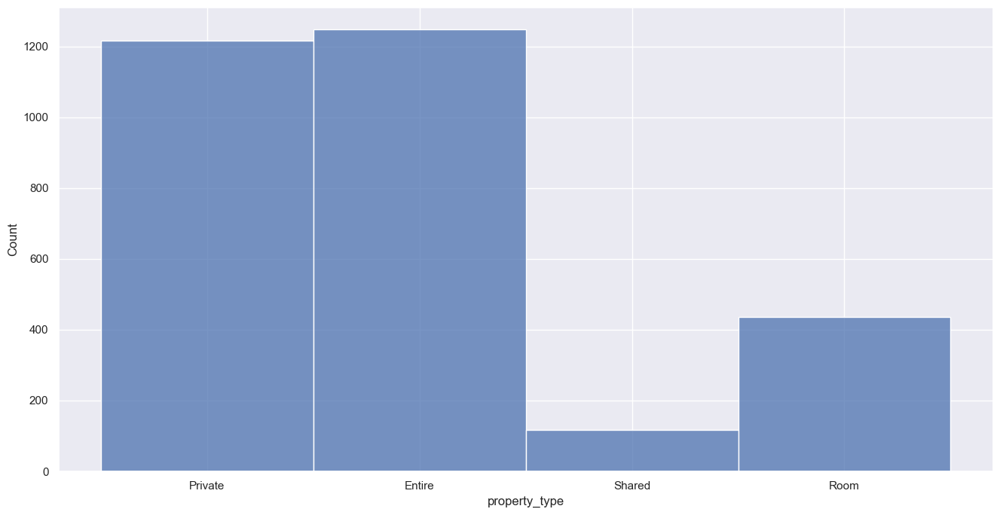

In [728]:
#Plot our updated df
f = plt.figure(figsize = (16,8))
sb.histplot(data = df["property_type"])

#### This representation is easier to be classified as we just need the type of room, reducing it to 4 categories.

---
### 5. EDA on accomodates
<b>accommodates</b>: The maximum capacity of the listing

In [729]:
accomodateDF = pd.DataFrame(airDF["accommodates"])
accomodateDF

,accommodates
0,6
1,1
2,2
3,1
4,1
...,...
3030,3
3031,3
3032,2
3033,4


In [730]:
accomodateDF.describe()

,accommodates
count,3035.000000
mean,2.816145
std,2.225978
min,0.000000
25%,2.000000
50%,2.000000
75%,4.000000
max,16.000000


<AxesSubplot:>

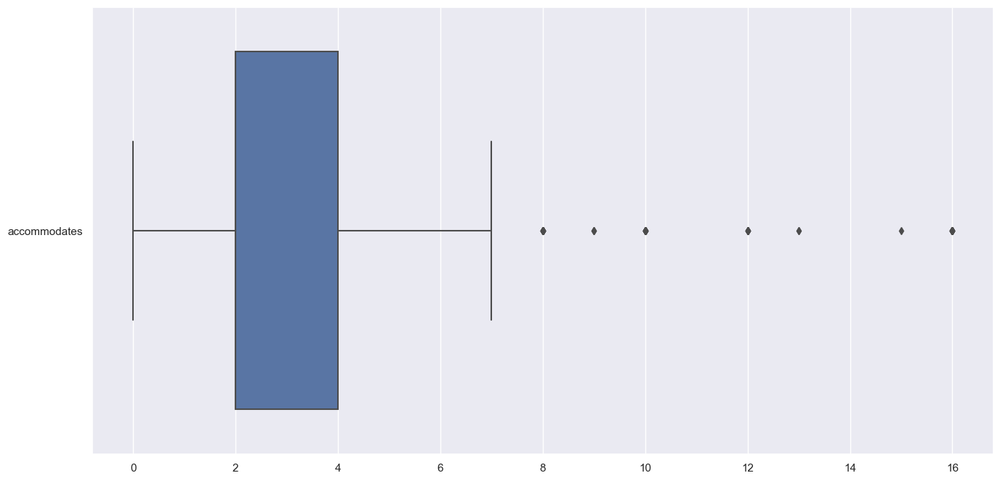

In [731]:
#Plot a boxplot first
f = plt.figure(figsize=(16,8))
sb.boxplot(data = accomodateDF, orient= 'h')

<AxesSubplot:ylabel='Count'>

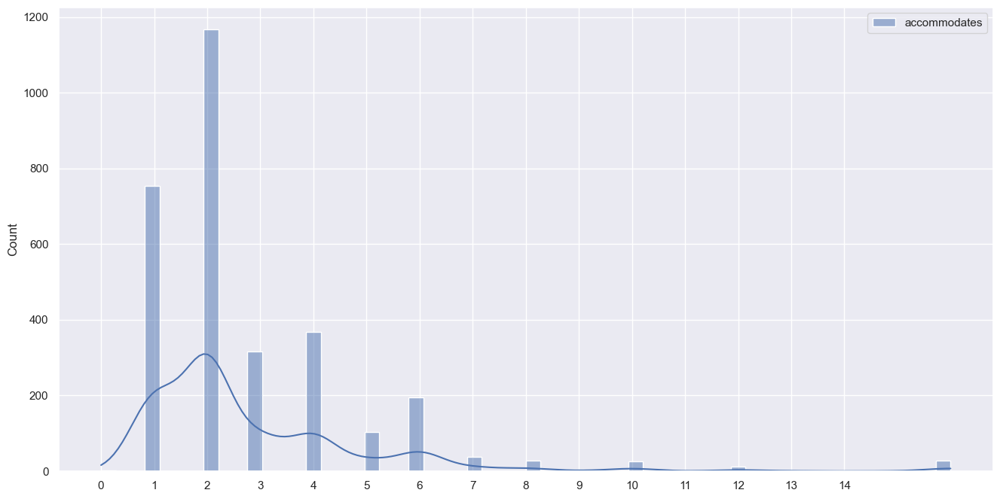

In [732]:
#Plot a histplot first
f = plt.figure(figsize=(16,8))
plt.xticks(np.arange(0, len(accomodateDF["accommodates"].unique()), step=1))  # Set label locations.
sb.histplot(data = accomodateDF, kde = True)

In [733]:
accomodateDF = remove_outliers(accomodateDF, ["accommodates"])
accomodateDF

,accommodates
0,6
1,1
2,2
3,1
4,1
...,...
3030,3
3031,3
3032,2
3033,4


<AxesSubplot:>

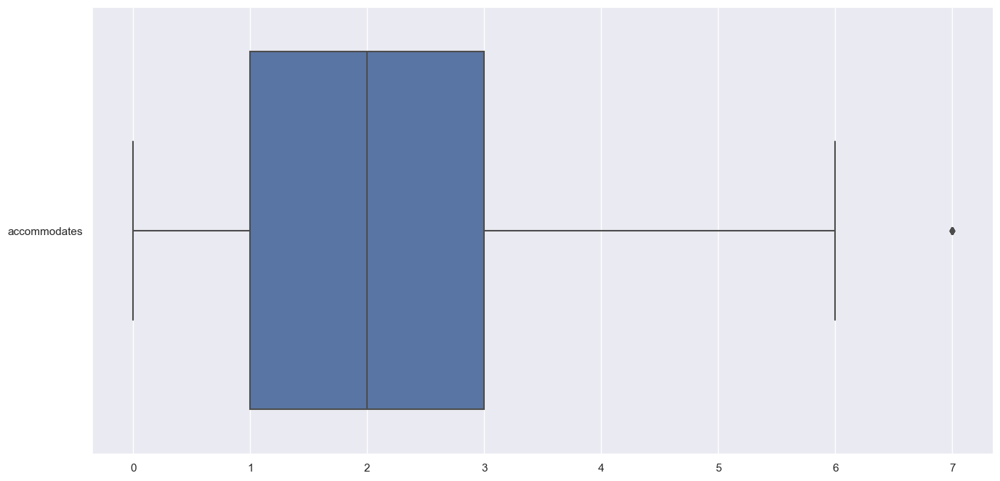

In [734]:
#Plot a boxplot first
f = plt.figure(figsize=(16,8))
sb.boxplot(data = accomodateDF, orient= 'h')

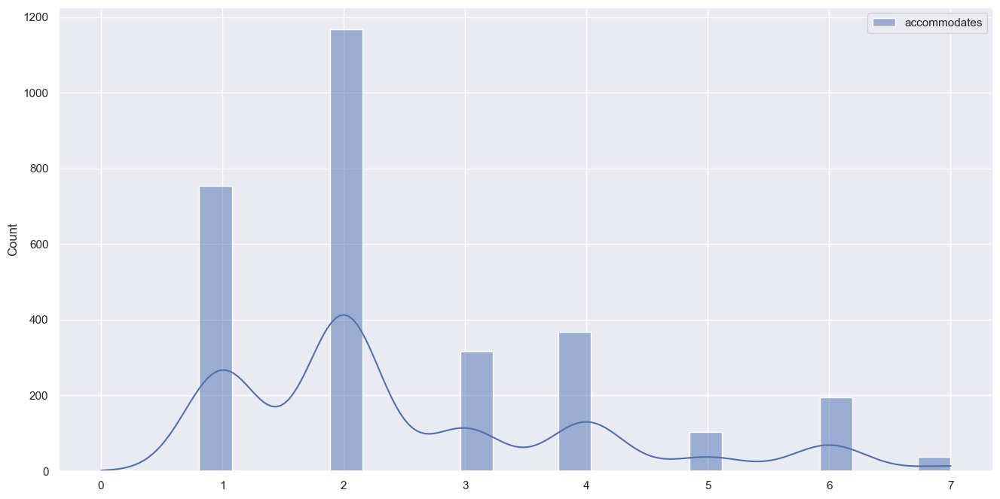

In [735]:
#Plot a histplot first
f = plt.figure(figsize=(16,8))
plt.xticks(np.arange(0, len(accomodateDF["accommodates"].unique()), step=1))  # Set label locations.
sb.histplot(data = accomodateDF, kde = True)
None

#### Generally, most listings have around 1-4 accomodates that can stay at a listing at a time.

---
### 6. EDA on bedrooms
<b>bedrooms</b>: The number of bedrooms


In [736]:
bedroomDF = pd.DataFrame(airDF["bedrooms"])
bedroomDF

,bedrooms
0,2.0
1,1.0
2,1.0
3,1.0
4,1.0
...,...
3030,1.0
3031,1.0
3032,1.0
3033,1.0


In [737]:
bedroomDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3035 entries, 0 to 3034
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   bedrooms  2730 non-null   float64
dtypes: float64(1)
memory usage: 23.8 KB


In [738]:
#There are some null values, so we fill it with 0 bedrooms
bedroomDF =bedroomDF.fillna(0)
bedroomDF

,bedrooms
0,2.0
1,1.0
2,1.0
3,1.0
4,1.0
...,...
3030,1.0
3031,1.0
3032,1.0
3033,1.0


In [739]:
#COnvert it to int
bedroomDF = pd.DataFrame(bedroomDF["bedrooms"].astype(int))
bedroomDF

,bedrooms
0,2
1,1
2,1
3,1
4,1
...,...
3030,1
3031,1
3032,1
3033,1


In [740]:
bedroomDF.describe()

,bedrooms
count,3035.000000
mean,1.152554
std,0.710215
min,0.000000
25%,1.000000
50%,1.000000
75%,1.000000
max,5.000000


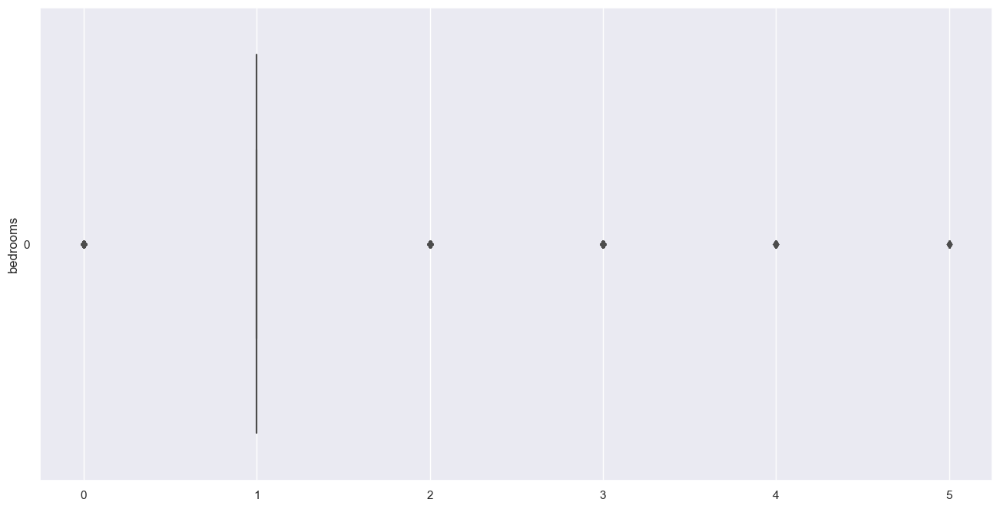

In [741]:
#Plot a boxplot first
f = plt.figure(figsize=(16,8))
sb.boxplot(data = bedroomDF["bedrooms"], orient= 'h').set(ylabel = "bedrooms")
None

<AxesSubplot:xlabel='bedrooms', ylabel='Count'>

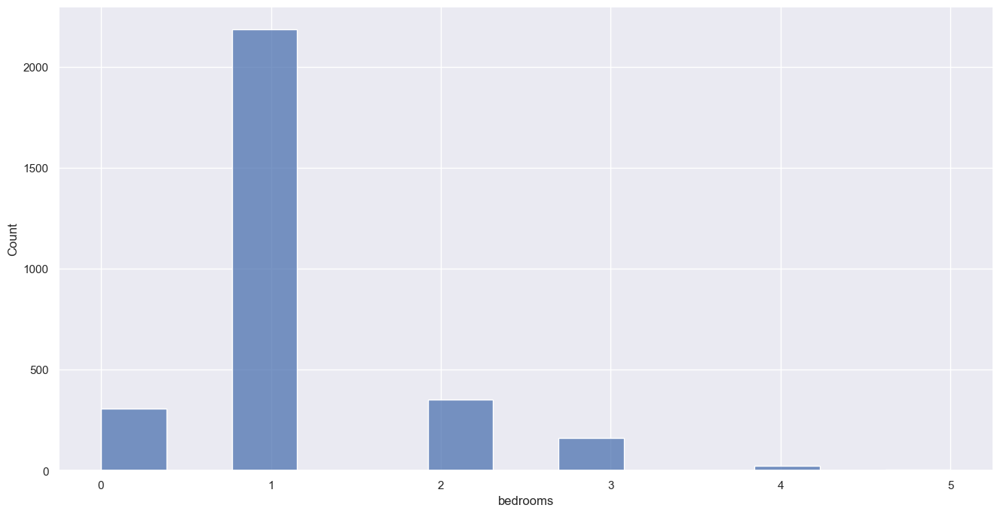

In [742]:
#Plot a boxplot first
f = plt.figure(figsize=(16,8))
sb.histplot(data = bedroomDF["bedrooms"])

#### We can see that most property listings has 1 bedroom, so we will not be using bedrooms as there is a large proportion of data skewed to 1 bedroom.

---
### 7. EDA on beds
<b>beds</b>: The number of bed(s)


In [743]:
bedDF = pd.DataFrame(airDF["beds"])
bedDF

,beds
0,3.0
1,1.0
2,2.0
3,1.0
4,1.0
...,...
3030,1.0
3031,1.0
3032,1.0
3033,3.0


In [744]:
bedDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3035 entries, 0 to 3034
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   beds    2945 non-null   float64
dtypes: float64(1)
memory usage: 23.8 KB


In [745]:
#Fill up the na values
bedDF = bedDF.fillna(0)
bedDF = pd.DataFrame(bedDF["beds"].astype(int))
bedDF.describe()

,beds
count,3035.000000
mean,1.766392
std,2.171562
min,0.000000
25%,1.000000
50%,1.000000
75%,2.000000
max,46.000000


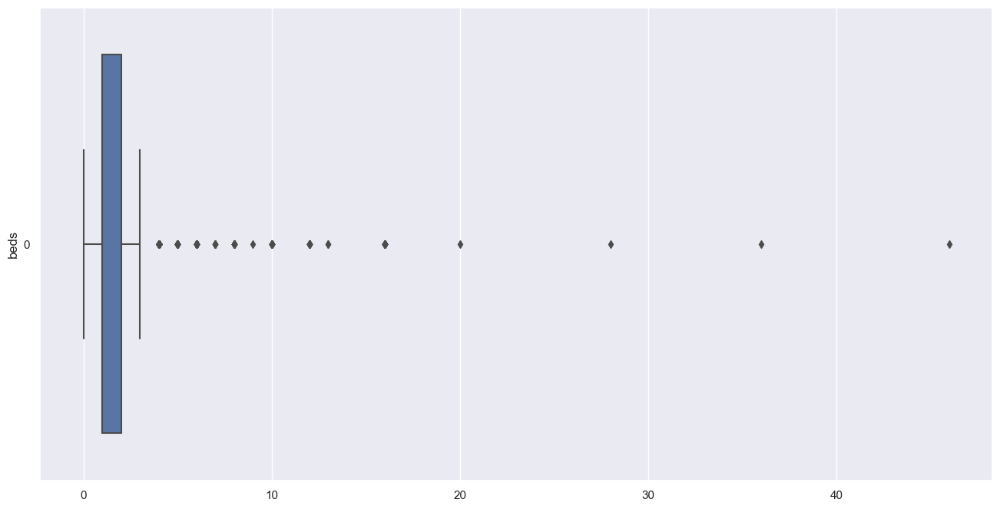

In [746]:
#Plot a boxplot first
f = plt.figure(figsize=(16,8))
sb.boxplot(data = bedDF["beds"], orient= 'h').set(ylabel = "beds")
None

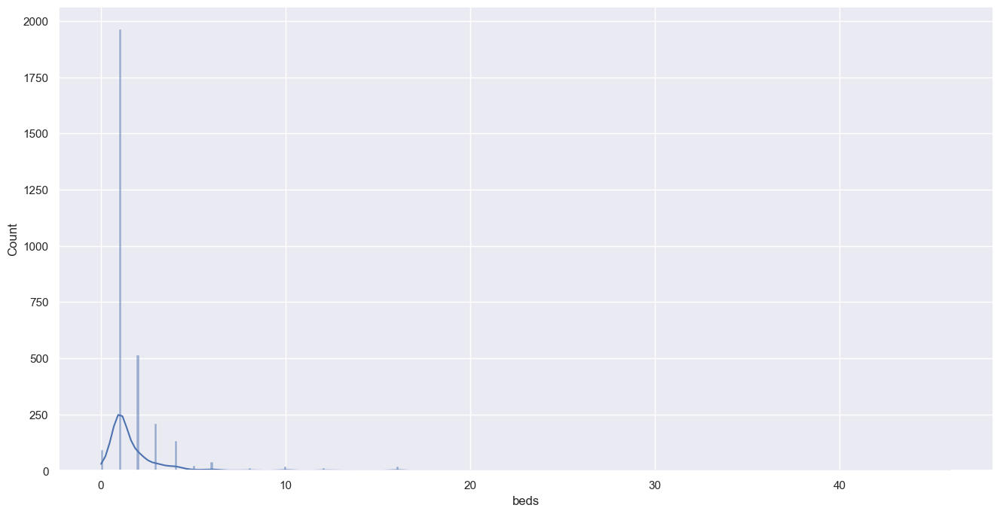

In [747]:
#Plot a histplot first
f = plt.figure(figsize=(16,8))
sb.histplot(data = bedDF["beds"], kde = True)
None

In [748]:
#Remove outliers
bedDF = remove_outliers(bedDF, ["beds"])

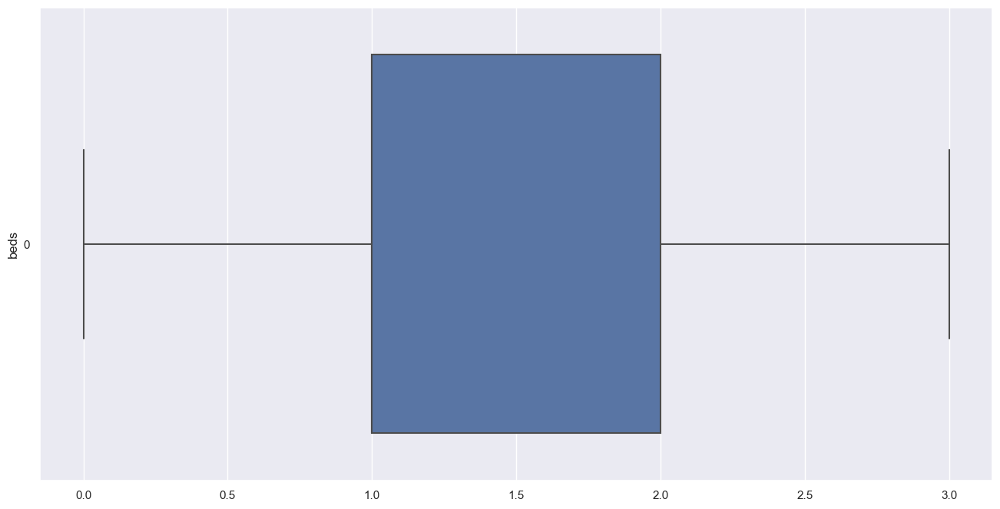

In [749]:
#Plot a boxplot first
f = plt.figure(figsize=(16,8))
sb.boxplot(data = bedDF["beds"], orient= 'h').set(ylabel = "beds")
None

<AxesSubplot:xlabel='beds', ylabel='Count'>

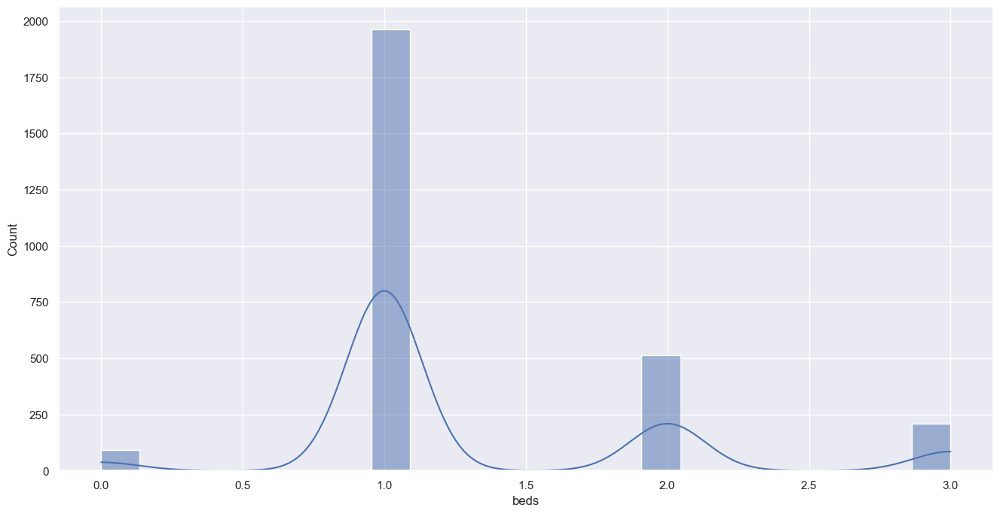

In [750]:
#Plot a histplot first
f = plt.figure(figsize=(16,8))
sb.histplot(data = bedDF["beds"], kde = True)

#### Again, majority of houses only has 1 bed, so we will not be using this variable as a predictor as the dataset is unbalanced.

---
### 8. EDA on amenities
<b>amenities</b>: The amenities in this hotel room


In [751]:
amenitiesDF = pd.DataFrame(airDF["amenities"])
amenitiesDF

,amenities
0,"[""Cooking basics"", ""Refrigerator"", ""Kitchen"", ..."
1,"[""Cooking basics"", ""Refrigerator"", ""Kitchen"", ..."
2,"[""Cooking basics"", ""Heating"", ""Kitchen"", ""Hair..."
3,"[""Air conditioning"", ""Shampoo"", ""Smoke alarm"",..."
4,"[""Air conditioning"", ""Shampoo"", ""Smoke alarm"",..."
...,...
3030,"[""First aid kit"", ""EV charger"", ""Heating"", ""Re..."
3031,"[""Air conditioning"", ""Smoke alarm"", ""Pool"", ""T..."
3032,"[""Air conditioning"", ""Security cameras on prop..."
3033,"[""Air conditioning"", ""Fire extinguisher"", ""Fir..."


In [752]:
amenitiesDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3035 entries, 0 to 3034
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   amenities  3035 non-null   object
dtypes: object(1)
memory usage: 23.8+ KB


In [753]:
cleanedAmenitiesDF = amenitiesDF.copy()
cleanedAmenitiesDF["no_amenities"] = 0
#Replace all with the integer variant
count = 0
for x in cleanedAmenitiesDF["amenities"]:   
    #Convert string into list
    x = x.replace('[',"")
    x = x.replace(']',"")
    x = x.replace('"', "")
    x = x.replace(", ", ",")
    x = x.split(",")
    cleanedAmenitiesDF["amenities"][count] = x
    cleanedAmenitiesDF["no_amenities"][count] = len(x)
    count += 1

cleanedAmenitiesDF.head(n=5)

/var/folders/q6/6qsmty7s2xj07bb_qyp5v77m0000gn/T/ipykernel_84642/2128996610.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleanedAmenitiesDF["amenities"][count] = x
/var/folders/q6/6qsmty7s2xj07bb_qyp5v77m0000gn/T/ipykernel_84642/2128996610.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleanedAmenitiesDF["no_amenities"][count] = len(x)


,amenities,no_amenities
0,"[Cooking basics, Refrigerator, Kitchen, Hair d...",33
1,"[Cooking basics, Refrigerator, Kitchen, Hair d...",31
2,"[Cooking basics, Heating, Kitchen, Hair dryer,...",26
3,"[Air conditioning, Shampoo, Smoke alarm, Long ...",17
4,"[Air conditioning, Shampoo, Smoke alarm, Long ...",18


In [754]:
#Want to visualize the total count of amenities so we can form a generalization such that our number of amenities remains reliable.
amenityCount = {}
for x in cleanedAmenitiesDF["amenities"]:
    for item in x:
        if item in amenityCount:
            amenityCount[item] += 1
        else:
            amenityCount[item] = 1
        
#Add it to a DF
amenityCountDF = pd.DataFrame(columns = ["amenity", "count"])
count = 0
for keys, values in amenityCount.items():
    amenityCountDF.loc[count] = [keys, values]
    count += 1

#Sort the DF
amenityCountDF = amenityCountDF.sort_values(by="count", ascending = False)
amenityCountDF.head(n=15)

,amenity,count
9,Long term stays allowed,3015
7,Wifi,2888
16,Air conditioning,2782
19,Essentials,2474
2,Kitchen,2306
32,Washer,2265
21,Hangers,2259
10,Iron,2145
3,Hair dryer,1949
30,Hot water,1941


In [755]:
amenityCountDF.tail(n=10)

,amenity,count
298,Bose sound system with Bluetooth and aux,1
299,Panasonic oven,1
300,Welch body soap,1
304,Backyard - Fully fenced,1
305,Fast wifi \u2013 253 Mbps,1
307,43\ HDTV with Amazon Prime Video,1
308,Fire TV,1
309,Body soap body soap,1
310,Fast wifi \u2013 325 Mbps,1
445,Coffee maker: french press,1


We have decided to only use those amenities that are very prominent in most of the listings as the number of amenities should be consistent, and not be filled with many values that do not matter. For example, we do not know what Fire TV is.

In [756]:
#Changeable cutoff that are determined by us to check for robustness of our model
amenityCutOff = 20

In [757]:
uselessAmenityList = amenityCountDF[amenityCountDF["count"] <= amenityCutOff]["amenity"].values.tolist()

In [758]:
#Remove all values in our df that correspond to our useless amenity list
count = 0
for x in cleanedAmenitiesDF["amenities"]:
    l = [i for i in x if i not in uselessAmenityList]
    cleanedAmenitiesDF.loc[count] = [l, len(l)]
    count +=1
cleanedAmenitiesDF

/Users/isaac/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3162: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).ndim


,amenities,no_amenities
0,"[Cooking basics, Refrigerator, Kitchen, Hair d...",31
1,"[Cooking basics, Refrigerator, Kitchen, Hair d...",29
2,"[Cooking basics, Heating, Kitchen, Hair dryer,...",25
3,"[Air conditioning, Shampoo, Smoke alarm, Long ...",17
4,"[Air conditioning, Shampoo, Smoke alarm, Long ...",18
...,...,...
3030,"[First aid kit, Heating, Refrigerator, Hair dr...",39
3031,"[Air conditioning, Smoke alarm, Pool, TV, Wifi...",6
3032,"[Air conditioning, Security cameras on propert...",9
3033,"[Air conditioning, Fire extinguisher, First ai...",15


In [759]:
cleanedAmenitiesDF["no_amenities"].describe()

count    3035.000000
mean       22.634596
std        10.660856
min         1.000000
25%        14.000000
50%        22.000000
75%        29.000000
max        64.000000
Name: no_amenities, dtype: float64

##### Perform analysis on the words appearing in amenities to see what is popular

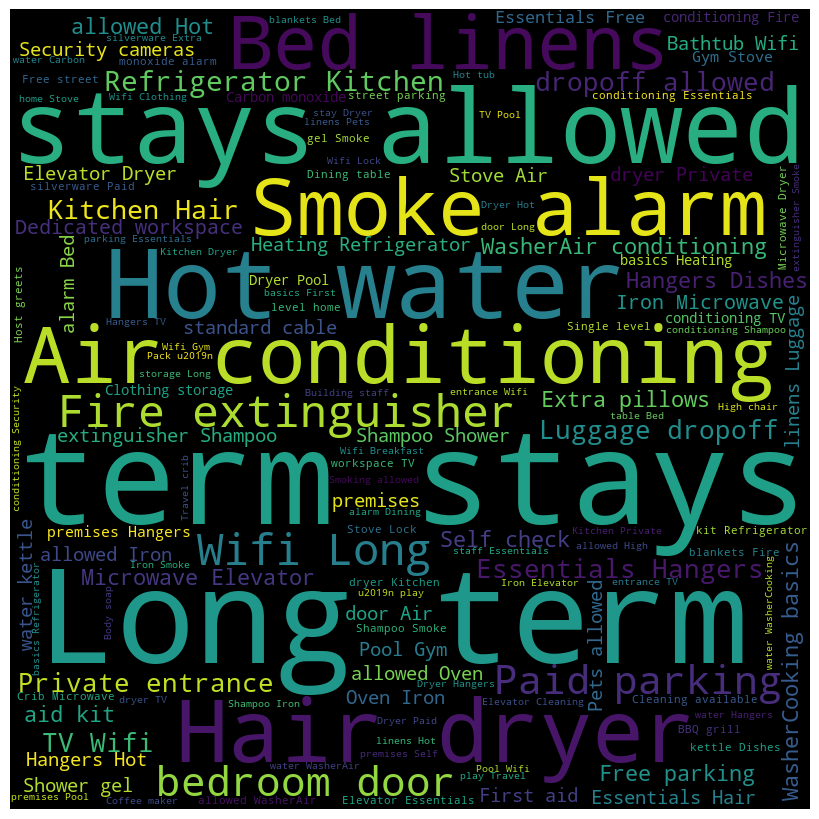

In [760]:
#Gather the neighbourhood overview DF
amenitiesText = "".join(amenitiesDF["amenities"].astype(str))
breaks = ["[","]",'"', "'",'\u2019s']
breaks2 = ['\u2013']

for x in breaks:    
    amenitiesText = amenitiesText.replace(x, "")
    
for x in breaks2:    
    amenitiesText = amenitiesText.replace(x, ",")

#Manually replace commas for space
amenitiesText = amenitiesText.replace(",", " ")

#Create wordcloud
wordcloud = WordCloud(width=800, height=800,
                      background_color='black',
                      min_font_size=10).generate(amenitiesText)

#Plot the wordcloud
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

#### Many properties have amenities that allow long term stays, air conditioning, and hot water, hair dryers, smoke alarm. This means that most properties that are on listing have these basic amenities.

##### Perform analysis on the number of amenities

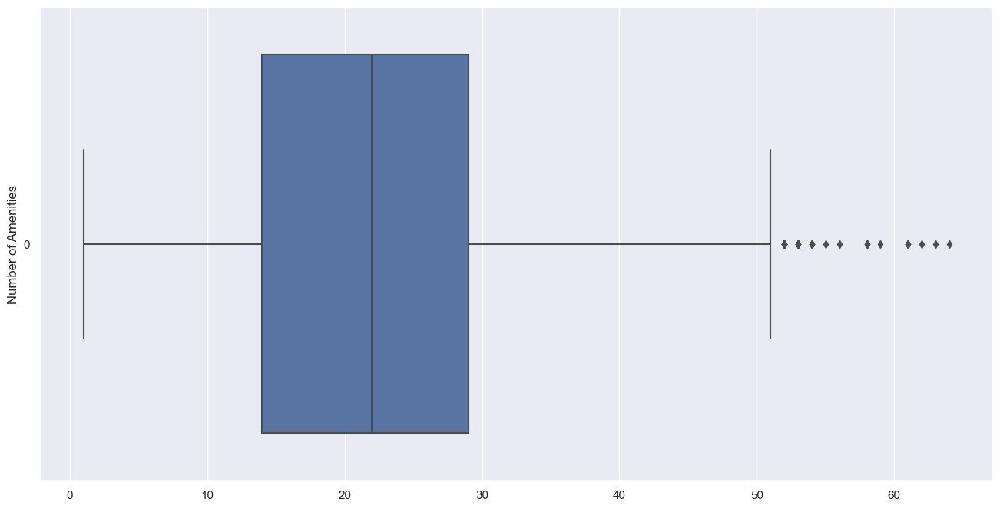

In [761]:
#Plot a boxplot first
f = plt.figure(figsize=(16,8))
sb.boxplot(data = cleanedAmenitiesDF["no_amenities"], orient= 'h').set(ylabel = "Number of Amenities")
None

<AxesSubplot:xlabel='no_amenities', ylabel='Count'>

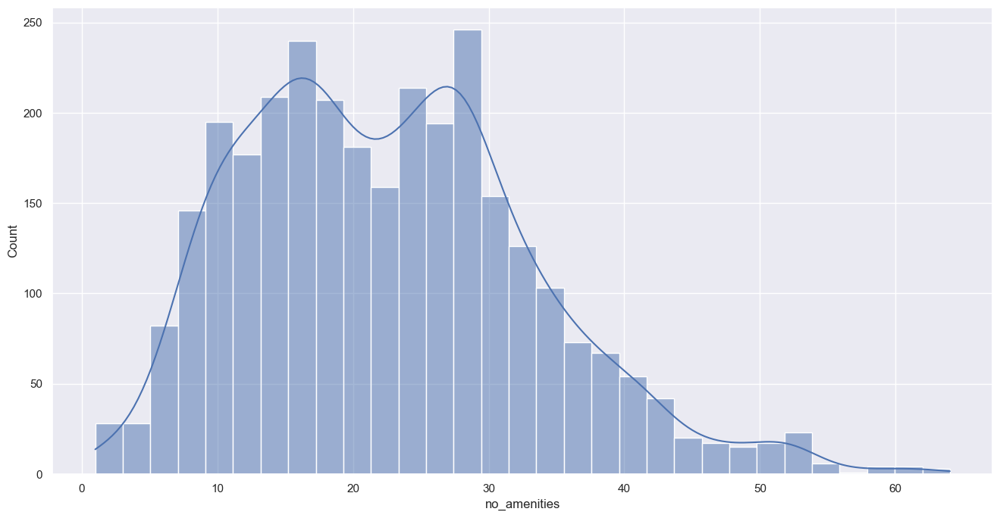

In [762]:
f = plt.figure(figsize=(16,8))
sb.histplot(data = cleanedAmenitiesDF["no_amenities"], kde = True)

#### The number of amenities has potential as being one of the predictors, with it being following a decent distribution, we will compare it to price in our main file.

---
### 9. EDA on price
<b>price</b>: daily price in local currency


In [763]:
priceDF = pd.DataFrame(airDF["price"])
priceDF

,price
0,"$46,437.00"
1,$81.00
2,$81.00
3,$52.00
4,$49.00
...,...
3030,$797.00
3031,$700.00
3032,$83.00
3033,$434.00


In [764]:
#The values are in string, so lets remove the $ and convert to int as all values are .00   percentageMapDF.loc[:,('listingnumber')][count]
breaks = [",", "$"]
for i in range(len(priceDF)):
    s = priceDF.loc[:,("price")][i]
    for x in breaks:
        s = s.replace(x,"")
    s = "".join(s.split(".")[:-1])
    priceDF.loc[:,("price")][i] = s

#Then assigned to clean df
cleanedPriceDF = pd.DataFrame(priceDF["price"].astype(int))
cleanedPriceDF

,price
0,46437
1,81
2,81
3,52
4,49
...,...
3030,797
3031,700
3032,83
3033,434


In [765]:
cleanedPriceDF.describe()

,price
count,3035.000000
mean,387.826359
std,3696.282090
min,0.000000
25%,79.000000
50%,160.000000
75%,299.500000
max,135140.000000


<AxesSubplot:>

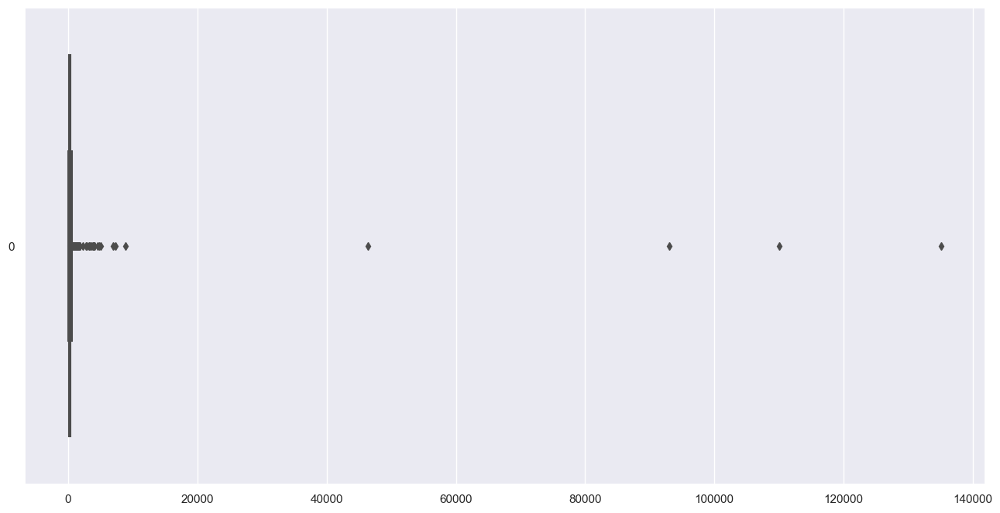

In [766]:
#Plot a boxplot to see the distribution
f = plt.figure(figsize=(16,8))
sb.boxplot(data = cleanedPriceDF["price"], orient= 'h')

<AxesSubplot:xlabel='price', ylabel='Count'>

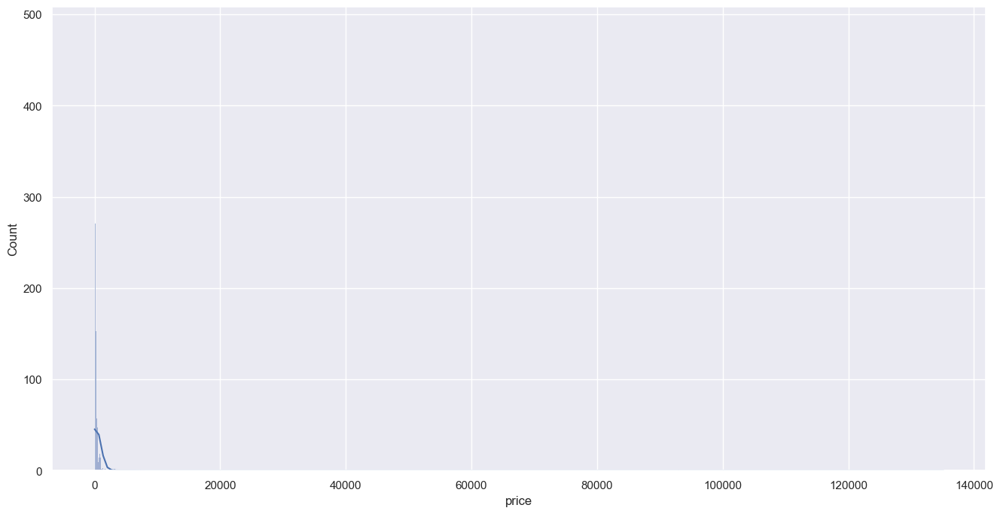

In [767]:
f = plt.figure(figsize=(16,8))
sb.histplot(data = cleanedPriceDF["price"], kde = True)

It is heavily affected by outliers, let us remove outliers and replot our plots.

In [768]:
cleanedPriceDF = remove_outliers(cleanedPriceDF, ["price"])
cleanedPriceDF

,price
1,81
2,81
3,52
4,49
5,175
...,...
3027,45
3028,45
3029,186
3032,83


In [769]:
cleanedPriceDF.describe()

,price
count,2772.000000
mean,179.445887
std,132.381930
min,0.000000
25%,70.000000
50%,146.000000
75%,244.250000
max,629.000000


<AxesSubplot:>

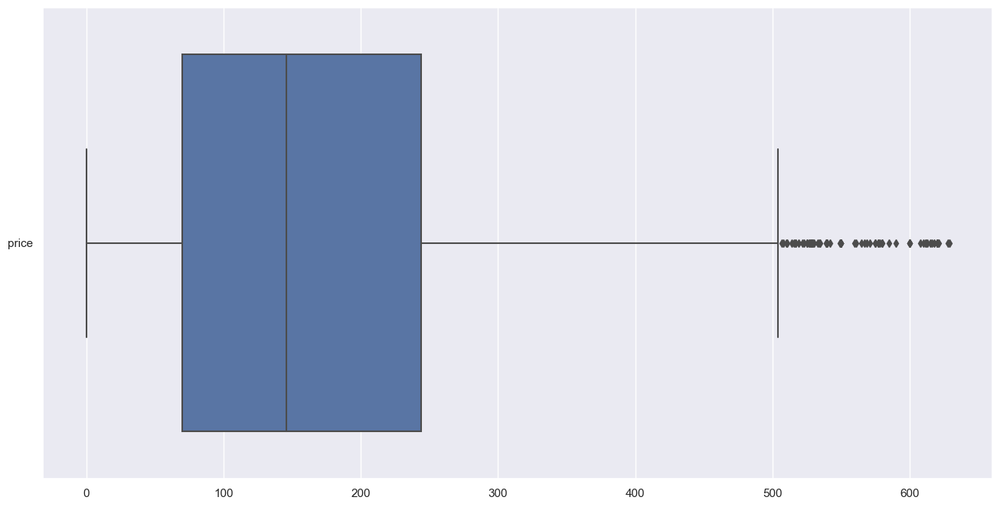

In [770]:
#Plot a boxplot to see the distribution
f = plt.figure(figsize=(16,8))
sb.boxplot(data = cleanedPriceDF, orient= 'h')

<AxesSubplot:ylabel='Count'>

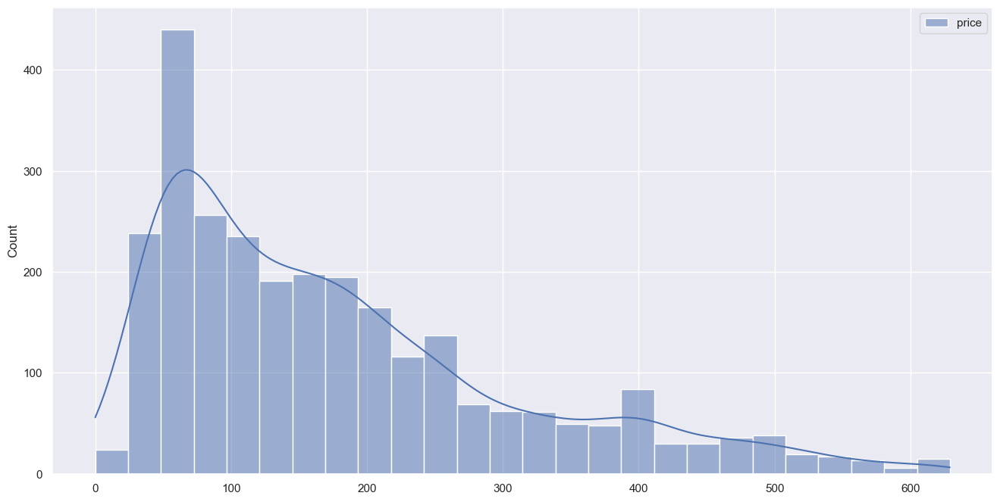

In [771]:
f = plt.figure(figsize=(16,8))
sb.histplot(data = cleanedPriceDF, kde = True)

#### After removing the outliers, the result is positively skewed with a good distribution of prices spread among the listings.

---
### 10. EDA on minimum_nights
<b>minimum_nights</b>: minimum number of night stay for the listing 


In [772]:
minimumNightsDF = pd.DataFrame(airDF["minimum_nights"])
minimumNightsDF

,minimum_nights
0,92
1,92
2,92
3,60
4,60
...,...
3030,1
3031,1
3032,1
3033,1


In [773]:
minimumNightsDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3035 entries, 0 to 3034
Data columns (total 1 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   minimum_nights  3035 non-null   int64
dtypes: int64(1)
memory usage: 23.8 KB


<AxesSubplot:>

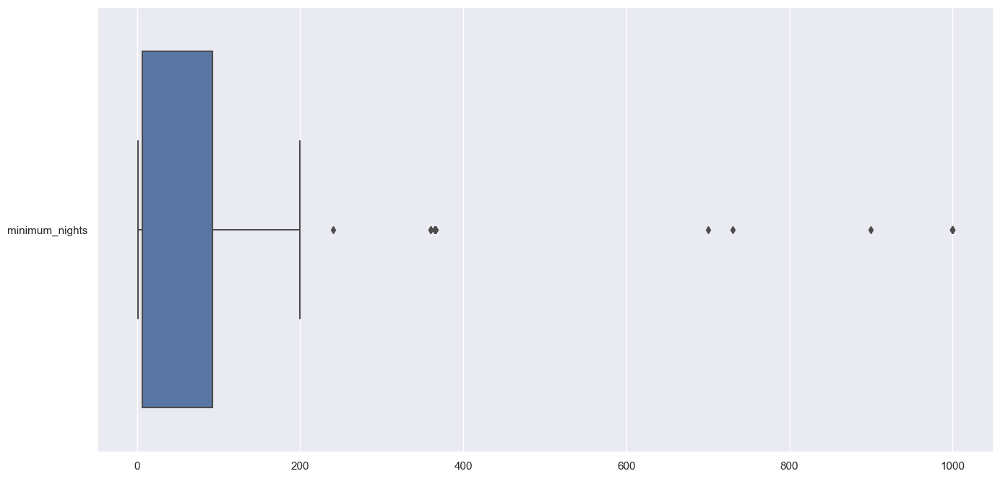

In [774]:
#Plot a boxplot to see the distribution
f = plt.figure(figsize=(16,8))
sb.boxplot(data = minimumNightsDF, orient= 'h')

<AxesSubplot:ylabel='Count'>

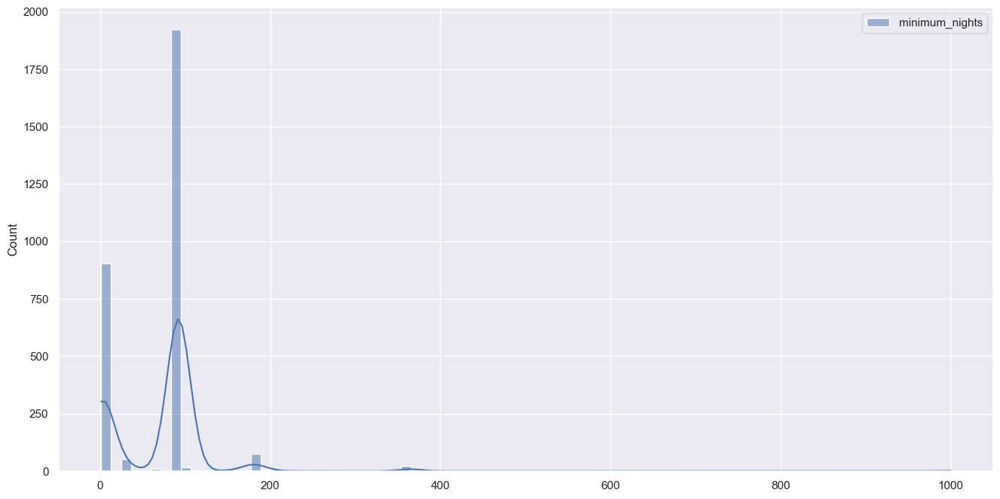

In [775]:
f = plt.figure(figsize=(16,8))
sb.histplot(data = minimumNightsDF, kde = True)

In [776]:
#Remove outliers to check for the general distribution
minimumNightsDF = remove_outliers(minimumNightsDF, ["minimum_nights"])

In [777]:
minimumNightsDF.describe()

,minimum_nights
count,3002.000000
mean,66.788141
std,45.306492
min,1.000000
25%,6.000000
50%,92.000000
75%,92.000000
max,200.000000


In [778]:
minimumNightsDF.value_counts()

minimum_nights
92                1893
1                  424
6                  306
2                  114
180                 69
30                  48
7                   42
93                  19
100                 10
90                   9
60                   9
3                    7
200                  5
5                    5
120                  4
183                  4
99                   4
10                   3
170                  3
96                   3
25                   2
190                  2
150                  2
95                   2
8                    2
110                  1
108                  1
160                  1
168                  1
4                    1
9                    1
185                  1
188                  1
189                  1
16                   1
28                   1
dtype: int64

<AxesSubplot:>

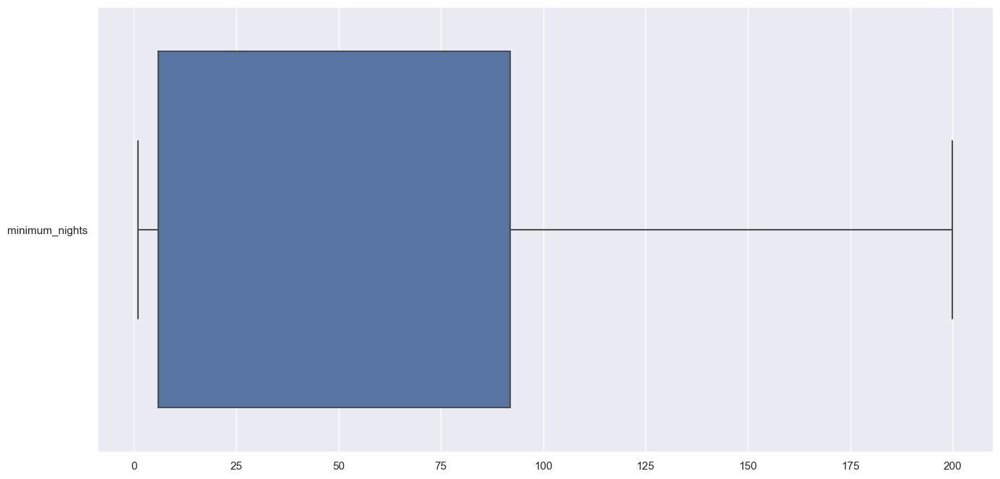

In [779]:
#Plot a boxplot to see the distribution
f = plt.figure(figsize=(16,8))
sb.boxplot(data = minimumNightsDF, orient= 'h')

<AxesSubplot:ylabel='Count'>

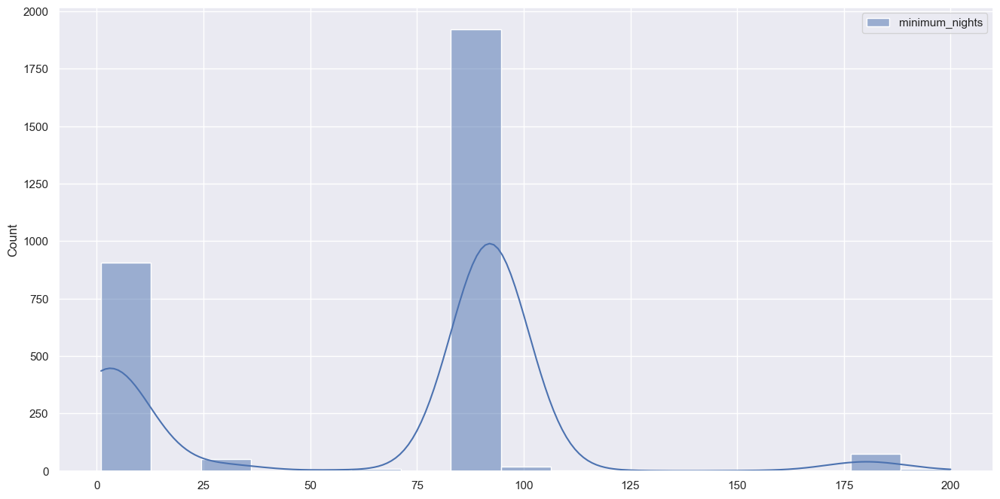

In [780]:
f = plt.figure(figsize=(16,8))
sb.histplot(data = minimumNightsDF, kde = True)

#### We can infer that there is a higher proportion of listings that have minimum 92 days stay throughout Singapore. This is accurate as Singapore does not allow the renting out of houses for less than 3 months notice. We can use this variable to calculate the minimum profit that a host can learn assuming the vistor stays the minimum stay period for our predictions.



---
### 11. EDA on maximum_nights
<b>maximum_nights</b>: maximum number of night stay for the listing


In [781]:
maximumNightDF = pd.DataFrame(airDF["maximum_nights"])
maximumNightDF

,maximum_nights
0,1125
1,1125
2,1125
3,999
4,999
...,...
3030,365
3031,365
3032,365
3033,365


In [782]:
maximumNightDF.describe()

,maximum_nights
count,3035.000000
mean,856.781219
std,1847.788589
min,2.000000
25%,365.000000
50%,1125.000000
75%,1125.000000
max,100000.000000


<AxesSubplot:>

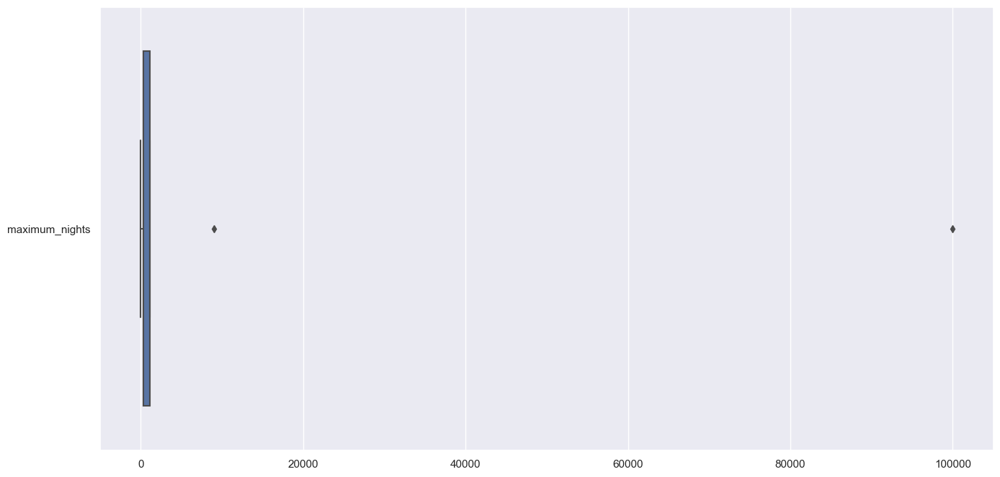

In [783]:
#Plot a boxplot to see the distribution
f = plt.figure(figsize=(16,8))
sb.boxplot(data = maximumNightDF, orient= 'h')

<AxesSubplot:ylabel='Count'>

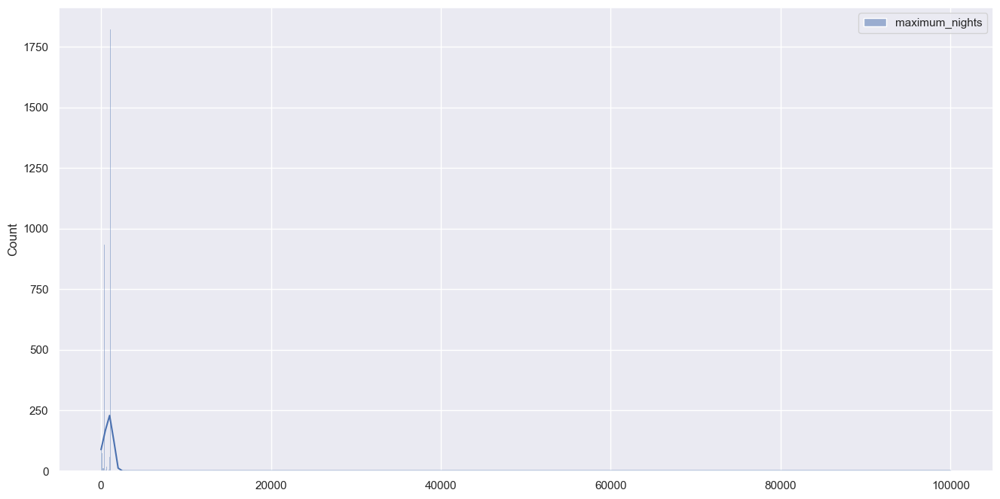

In [784]:
f = plt.figure(figsize=(16,8))
sb.histplot(data = maximumNightDF, kde = True)

In [785]:
#Remove outliers
maximumNightDF = remove_outliers(maximumNightDF, ["maximum_nights"])

In [786]:
maximumNightDF.describe()

,maximum_nights
count,3033.000000
mean,821.407847
std,389.317163
min,2.000000
25%,365.000000
50%,1125.000000
75%,1125.000000
max,1125.000000


<AxesSubplot:>

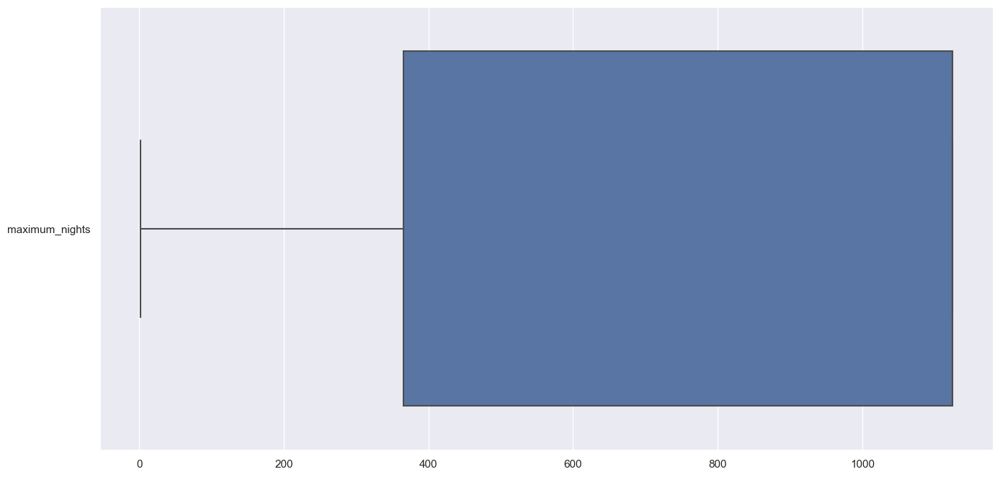

In [787]:
#Plot a boxplot to see the distribution
f = plt.figure(figsize=(16,8))
sb.boxplot(data = maximumNightDF, orient= 'h')

<AxesSubplot:ylabel='Count'>

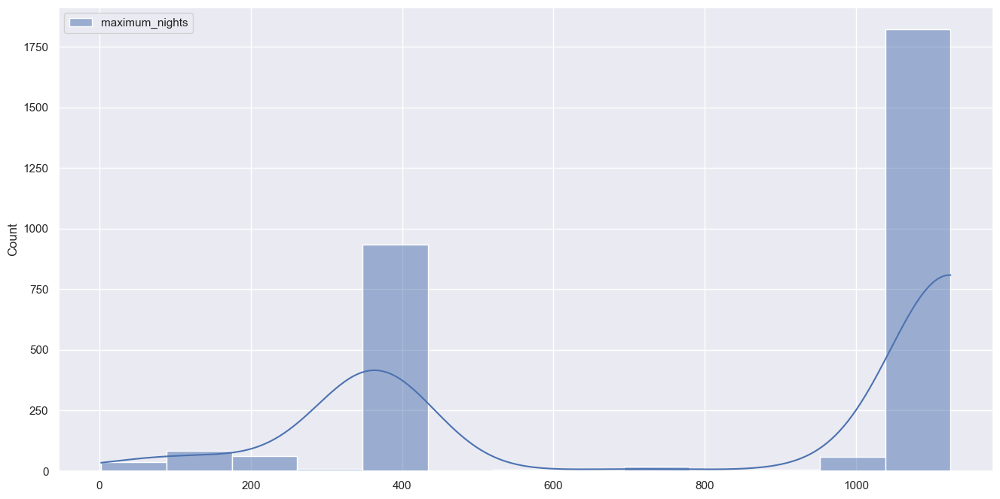

In [788]:
f = plt.figure(figsize=(16,8))
sb.histplot(data = maximumNightDF, kde = True)

#### We can infer that most of the hosts only allow up to 1125 days maximum stay, which is about 3 years, while at the 1st quartile, 365 days for stay at each listing. We can use this variable to calculate the max profit that a host can earn if a visitor decides to stay the maximum duration for our prediction.